In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2 as cv
import os

In [3]:
model = YOLO("./model/detect_info.pt")

In [4]:
names = ['avatar', 'qr_code', 'text']

In [5]:
def plot_img(list_images):
    length_img = len(list_images)
    
    col = 4
    row = length_img // col
    
    if length_img % col != 0:
        row += 1
    
    plt.figure(figsize=(15, length_img))
    for i in range(row):
        for j in range(col):
            idx = i * 3 + j
            if idx >= length_img : break
            
            plt.subplot(row, col, idx+1)
            plt.imshow(list_images[idx])
            plt.axis('off')

In [6]:
def detection(data_path, names):
    list_img_path = [os.path.join(data_path, x) for x in os.listdir(data_path)]
    list_images = []
    for img_path in list_img_path:
        img = cv.imread(img_path)
        result = model.predict(img, conf=0.4)
        colors = [(55, 255, 100), (155, 55, 20),(0, 255, 0), (255, 255, 0), (255, 0, 0),(0, 0, 255), (128, 128, 128), (0, 255, 255), (0, 0, 0), (100, 0, 255), (200, 2550, 50)]
        img = cv.imread(img_path)
        boxes, class_idx, confident = [], [], []

        for box, idx, conf in zip(result[0].boxes.xyxy, result[0].boxes.cls, result[0].boxes.conf):
            x, y, w, h = [int(x) for x in box]
            color = colors[int(idx)]
            name = names[int(idx)]
            cv.rectangle(img, (x, y), (w, h), color, thickness=2)
            title = name + " " + str(float(conf))[:4]
            cv.putText(img,title , (x, y-10), cv.FONT_HERSHEY_SIMPLEX, 1, color,2,cv.LINE_AA, False)
           
        list_images.append(img)
    return list_images

In [ ]:
print(names)

In [7]:
test_dir = "./Datasets/train/images"

In [8]:
detection_result = detection(test_dir, names)

0: 640x640 1 avatar, 1 qr_code, 9 texts, 1575.8ms
Speed: 7.5ms preprocess, 1575.8ms inference, 12.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 avatar, 1 qr_code, 10 texts, 1499.0ms
Speed: 3.3ms preprocess, 1499.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 avatars, 1 qr_code, 3 texts, 1474.6ms
Speed: 4.4ms preprocess, 1474.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 avatar, 1 qr_code, 7 texts, 1626.7ms
Speed: 4.4ms preprocess, 1626.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 avatar, 1 qr_code, 7 texts, 1536.4ms
Speed: 5.5ms preprocess, 1536.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 avatar, 1 qr_code, 9 texts, 1542.5ms
Speed: 3.3ms preprocess, 1542.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 avatar, 1 qr_code, 7 texts, 1490.4ms
Speed: 4.5ms preprocess, 1490.4ms inference, 1.2ms po

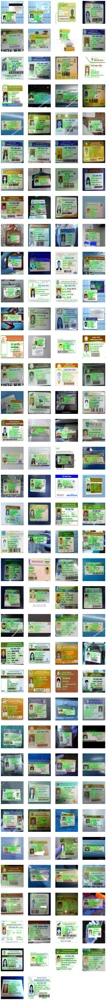

In [9]:
plot_img(detection_result)